In [1]:
import pandas as pd
import json
import geopandas as gpd
pd.set_option("max_colwidth", None)
pd.options.display.max_columns = None

In [10]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [23]:
df = pd.read_pickle("../data/interim/CDC_PLACES_GEOID.pickle")
df[df.Year==2020]

,Year,StateAbbr,StateDesc,LocationName,Measure,Data_Value,Data_Value_Unit,GEOID
3,2020,AL,Alabama,Wilcox,No doctor visit for checkup in past year among adults aged >=18 years,20.6,%,01131
8,2020,AK,Alaska,Haines,Stroke among adults aged >=18 years,2.9,%,02100
13,2020,AK,Alaska,Prince of Wales-Hyder,Chronic obstructive pulmonary disease among adults aged >=18 years,7.4,%,02198
16,2020,AZ,Arizona,Maricopa,No dental visit in past year among adults aged >=18 years,38.3,%,04013
19,2020,AZ,Arizona,Yavapai,Current asthma among adults aged >=18 years,11.1,%,04025
...,...,...,...,...,...,...,...,...
228696,2020,WI,Wisconsin,Vernon,Sleeping less than 7 hours among adults aged >=18 years,31.6,%,55123
228711,2020,WI,Wisconsin,Langlade,All teeth lost among adults aged >=65 years,12.4,%,55067
228722,2020,WI,Wisconsin,Rusk,Older adult women aged >=65 years not up to date on clinical preventive services,66.0,%,55107
228735,2020,WV,West Virginia,Tyler,No mammography use among women aged 50-74 years,25.4,%,54095


In [24]:
for meas in df.Measure.unique():
    print(meas)

No doctor visit for checkup in past year among adults aged >=18 years
Stroke among adults aged >=18 years
Chronic obstructive pulmonary disease among adults aged >=18 years
No dental visit in past year among adults aged >=18 years
Current asthma among adults aged >=18 years
Current smoking among adults aged >=18 years
No colorectal cancer screening among adults aged 50-75 years
Cancer (excluding skin cancer) among adults aged >=18 years
Diagnosed diabetes among adults aged >=18 years
No cervical cancer screening among adult women aged 21-65 years
Not taking medicine for high blood pressure among adults aged >=18 years
Depression among adults aged >=18 years
Coronary heart disease among adults aged >=18 years
Arthritis among adults aged >=18 years
No cholesterol screening among adults aged >=18 years
Binge drinking among adults aged >=18 years
Obesity among adults aged >=18 years
High blood pressure among adults aged >=18 years
All teeth lost among adults aged >=65 years
Fair or poor se

In [25]:
df = df[df.Year==2020]

In [35]:
pivot_df = df.pivot_table(index=['StateDesc', 'LocationName', 'GEOID'], 
                          columns='Measure', 
                          values='Data_Value')

In [36]:
pivot_df.head()

Measure                       All teeth lost among adults aged >=65 years  \
StateDesc LocationName GEOID                                                
Alabama   Autauga      01001                                         12.7   
          Baldwin      01003                                          9.9   
          Barbour      01005                                         22.3   
          Bibb         01007                                         17.0   
          Blount       01009                                         14.6   

Measure                       Arthritis among adults aged >=18 years  \
StateDesc LocationName GEOID                                           
Alabama   Autauga      01001                                    27.5   
          Baldwin      01003                                    27.3   
          Barbour      01005                                    32.0   
          Bibb         01007                                    29.4   
          Blount       01009                                    28.7   

Measure                       Binge drinking among adults aged >=18 years  \
StateDesc LocationName GEOID                                                
Alabama   Autauga      01001                                         15.7   
          Baldwin      01003                                         17.1   
          Barbour      01005                                         13.3   
          Bibb         01007                                         15.4   
          Blount       01009                                         15.9   

Measure                       Cancer (excluding skin cancer) among adults aged >=18 years  \
StateDesc LocationName GEOID                                                                
Alabama   Autauga      01001                                                          5.9   
          Baldwin      01003                                                          6.1   
          Barbour      01005                                                          5.6   
          Bibb         01007                                                          5.9   
          Blount       01009                                                          6.1   

Measure                       Chronic kidney disease among adults aged >=18 years  \
StateDesc LocationName GEOID                                                        
Alabama   Autauga      01001                                                  2.8   
          Baldwin      01003                                                  2.6   
          Barbour      01005                                                  3.9   
          Bibb         01007                                                  3.2   
          Blount       01009                                                  2.9   

Measure                       Chronic obstructive pulmonary disease among adults aged >=18 years  \
StateDesc LocationName GEOID                                                                       
Alabama   Autauga      01001                                                                 7.3   
          Baldwin      01003                                                                 6.7   
          Barbour      01005                                                                10.4   
          Bibb         01007                                                                 9.1   
          Blount       01009                                                                 8.6   

Measure                       Coronary heart disease among adults aged >=18 years  \
StateDesc LocationName GEOID                                                        
Alabama   Autauga      01001                                                  6.3   
          Baldwin      01003                                                  5.9   
          Barbour      01005                                                  8.1   
          Bibb         01007             

In [39]:
# Getting the health metrics from the pivot table
health_metrics = pivot_df.iloc[:, 3:]  # Excluding the first three index columns

# Handling missing values by filling them with the mean of each column
health_metrics_filled = health_metrics.fillna(health_metrics.mean())

# Standardizing the health metrics data
scaler = StandardScaler()
health_metrics_scaled = scaler.fit_transform(health_metrics_filled)

# Applying K-means clustering to the health metrics
kmeans_health = KMeans(n_clusters=7, random_state=0)
clusters_health = kmeans_health.fit_predict(health_metrics_scaled)

# Attaching the cluster information back to the pivot_df
pivot_df['Cluster'] = clusters_health

# Displaying a snippet of the result with cluster labels
df_clusters = pivot_df.reset_index()[['StateDesc', 'LocationName', 'GEOID', 'Cluster']] # Reset index for display purposes

/home/myuser/.local/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [40]:
df_clusters

Measure,StateDesc,LocationName,GEOID,Cluster
0,Alabama,Autauga,01001,5
1,Alabama,Baldwin,01003,2
2,Alabama,Barbour,01005,3
3,Alabama,Bibb,01007,1
4,Alabama,Blount,01009,5
...,...,...,...,...
3130,Wyoming,Sublette,56035,4
3131,Wyoming,Sweetwater,56037,0
3132,Wyoming,Uinta,56041,0
3133,Wyoming,Washakie,56043,0


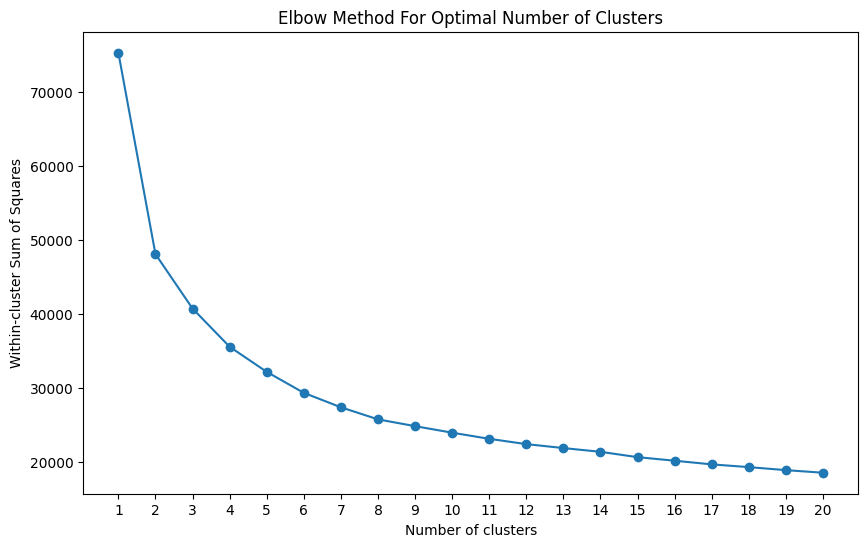

In [43]:
import numpy as np

# Determining the optimal number of clusters using the Elbow Method
# Calculating the within-cluster sum of squares for different numbers of clusters

wcss = []  # List to store the within-cluster sum of squares
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(health_metrics_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 21), wcss, marker='o')
plt.title('Elbow Method For Optimal Number of Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Within-cluster Sum of Squares')
plt.xticks(np.arange(1, 21, step=1))
plt.show()


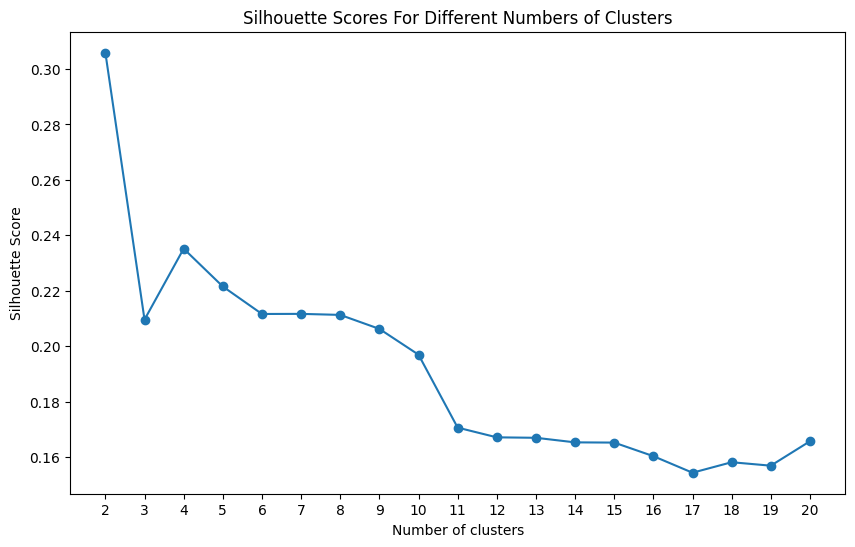

In [46]:
from sklearn.metrics import silhouette_score

# Calculating the silhouette scores for different numbers of clusters
silhouette_scores = []  # List to store the silhouette scores

# We will only test from 2 to 5 clusters for silhouette analysis as silhouette score is not defined for single cluster.
num_clusters = 21
for i in range(2, num_clusters):
    kmeans_silhouette = KMeans(n_clusters=i, random_state=0,n_init='auto')
    clusters_silhouette = kmeans_silhouette.fit_predict(health_metrics_scaled)
    score = silhouette_score(health_metrics_scaled, clusters_silhouette)
    silhouette_scores.append(score)

# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, num_clusters), silhouette_scores, marker='o')
plt.title('Silhouette Scores For Different Numbers of Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.xticks(np.arange(2, num_clusters, step=1))
plt.show()


In [47]:
# Applying K-means clustering to the health metrics
kmeans_health = KMeans(n_clusters=4, random_state=0,n_init='auto')
clusters_health = kmeans_health.fit_predict(health_metrics_scaled)

# Attaching the cluster information back to the pivot_df
pivot_df['Cluster'] = clusters_health

# Displaying a snippet of the result with cluster labels
df_clusters = pivot_df.reset_index()[['StateDesc', 'LocationName', 'GEOID', 'Cluster']] # Reset index for display purposes

In [48]:
df_clusters

Measure,StateDesc,LocationName,GEOID,Cluster
0,Alabama,Autauga,01001,3
1,Alabama,Baldwin,01003,0
2,Alabama,Barbour,01005,1
3,Alabama,Bibb,01007,1
4,Alabama,Blount,01009,3
...,...,...,...,...
3130,Wyoming,Sublette,56035,0
3131,Wyoming,Sweetwater,56037,2
3132,Wyoming,Uinta,56041,2
3133,Wyoming,Washakie,56043,2


In [50]:
# GeoJSON file
file_path_geo_json = "../data/interim/us_census_counties_geojson.json"
with open(file_path_geo_json) as f:
    counties = json.load(f)

In [62]:
import plotly.graph_objects as go

custom_colorscale = [
    [0, "rgb(0,104,55)"],     # Dark green for the best cluster (0)
    [0.33, "rgb(165,0,38)"],  # Dark red for the worst cluster (1)
    [0.66, "rgb(199,233,180)"], # Greenish yellow for the second-best cluster (2)
    [1, "rgb(252,141,89)"],   # Soft red for the third-best cluster (3)
]

# Create the choropleth map using Plotly
fig = go.Figure(go.Choropleth(
    geojson=counties,  # Your GeoJSON file
    featureidkey="properties.GEOID",  # The key in GeoJSON features which matches the GEOID
    locations=df_clusters['GEOID'],  # The county FIPS codes from your DataFrame
    z=df_clusters['Cluster'],  # The cluster numbers
    autocolorscale=False,
    colorscale=custom_colorscale,  # Use a perceptually uniform color scale
    hovertemplate = '%{customdata[0]}<extra>Cluster: %{z}</extra>',
    customdata=df_clusters[['LocationName']],  # Additional data for hover (County Name)
    colorbar=dict(thickness=20, title='Cluster'),  # Color bar properties
    #marker_line_color='white',  # Boundary line color
    marker_line_width=0.5,  # Boundary line width
    showscale=False
))


# Update layout to focus on USA and set other properties
fig.update_layout(
    geo=dict(scope="usa"),  # Focus on USA
    margin={"r": 0, "l": 0, "b": 0, "t": 0},  # Margins
    title_text='Clusters of Public Health Metrics by County',
    title_y=0.85,  
    title_x=0.5,
    title_font=dict(size=20),
    width=1000,
    height=800
)

# Show the plot
fig.show()

In [ ]:
# 0 = dark green
# 1 = dark red
# 2 = light yellow
# 3 = light red